In [1]:
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

In [2]:
# path to where the images are saved

image_directory = Path('/kaggle/input/dog-vs-cat-images-data/dogcat')
image_directory

PosixPath('/kaggle/input/dog-vs-cat-images-data/dogcat')

In [3]:
cat_images_dir = image_directory / 'train'/ 'cats'
dog_images_dir = image_directory / 'train' / 'dogs'

print('The directory for cat images is',cat_images_dir)
print('The directory for dog images is',dog_images_dir)

The directory for cat images is /kaggle/input/dog-vs-cat-images-data/dogcat/train/cats
The directory for dog images is /kaggle/input/dog-vs-cat-images-data/dogcat/train/dogs


In [4]:
# import the random module
from random import choice,sample

# list of file names in cat folder
cat_filenames = [path for path in cat_images_dir.iterdir()]

# list of filenames in dog folder
dog_filenames = [path for path in dog_images_dir.iterdir()]

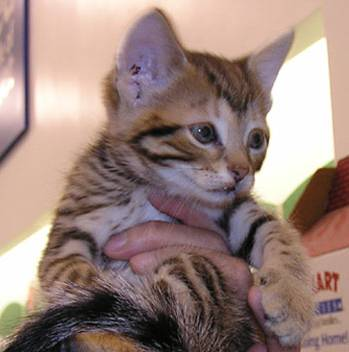

In [5]:
# read the image

Image.open(cat_filenames[0])

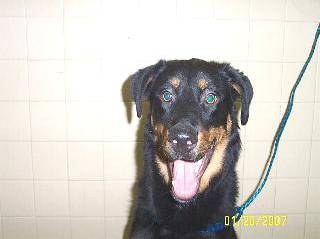

In [6]:
Image.open(dog_filenames[0])

In [7]:
# read some random images and display them

def display_random_images(filename_list,num_of_photos=9):
    random_filenames = sample(filename_list, num_of_photos)
    ind = 1
    num_rows = (num_of_photos // 3) + (num_of_photos % 3)
    num_of_columns = 3
    fig = plt.figure(figsize=(20,20))
    for image_path in random_filenames:
        # read the image
        img = Image.open(image_path)
        # print the image
        plt.subplot(num_rows,num_of_columns,ind)
        plt.imshow(img)
        plt.axis(False)
        # increase the ind value by one
        ind += 1

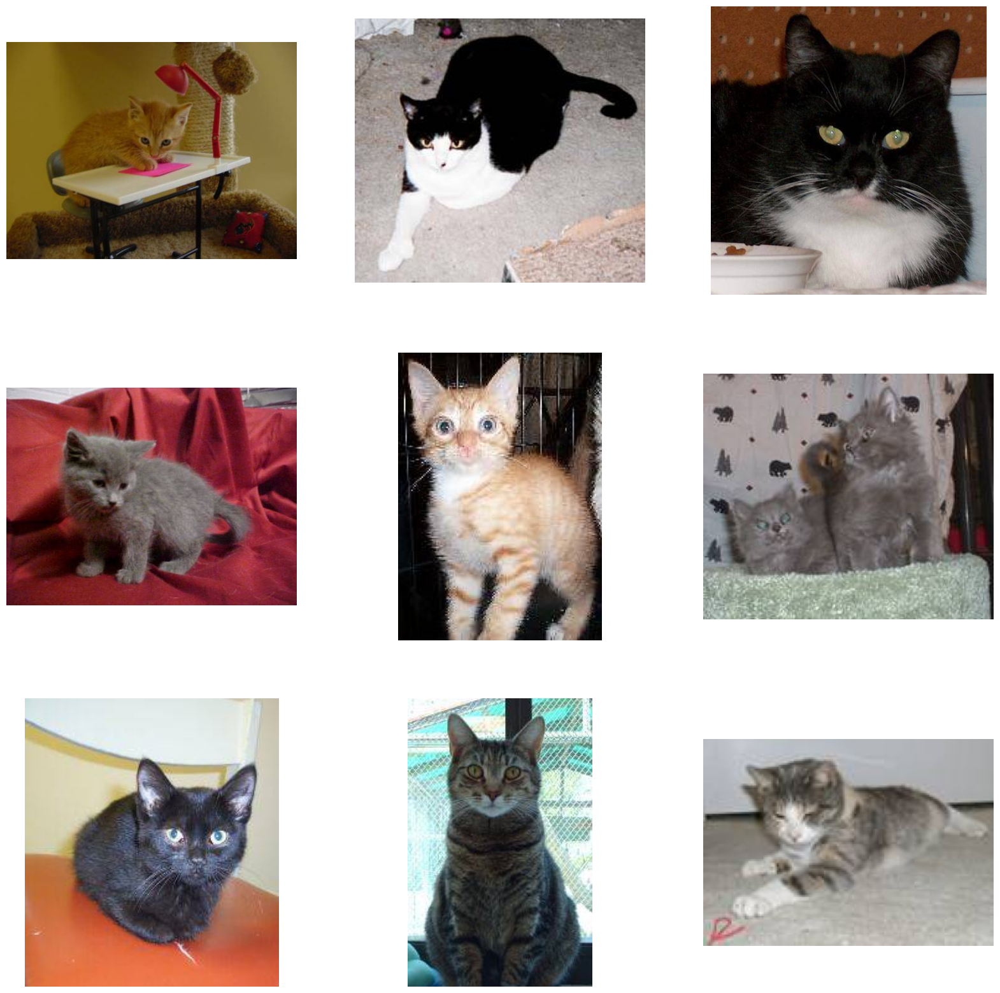

In [8]:
# display random cat images

display_random_images(filename_list=cat_filenames)

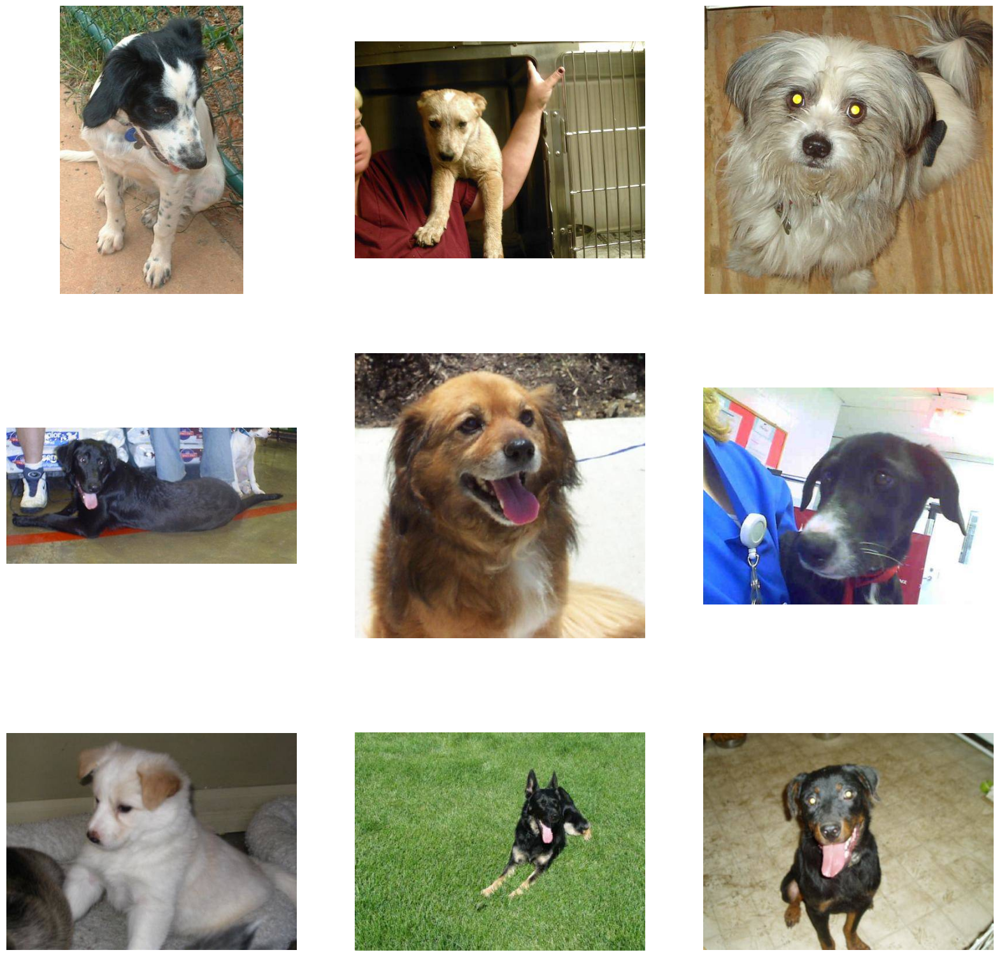

In [9]:
# display random dog images

display_random_images(filename_list=dog_filenames)

In [10]:
import os

In [11]:
# validate the extensions of filenames

def validate_file_extensions(files):
    valid_file_extensions = ['.jpg','.jpeg','.png']
    
    for file in files:
        # check whether the file name matches 
        if file.suffix in valid_file_extensions:
            continue
        else:
            os.remove(file)

In [12]:
# validate cat files

print('The number of files in the cat directory before validation are', len(cat_filenames))

validate_file_extensions(cat_filenames)

print('The number of files in the cat directory after validation are', len(cat_filenames))

The number of files in the cat directory before validation are 12500
The number of files in the cat directory after validation are 12500


In [13]:
# validate dog files

print('The number of files in the dog directory before validation are', len(cat_filenames))

validate_file_extensions(cat_filenames)

print('The number of files in the dog directory after validation are', len(cat_filenames))

The number of files in the dog directory before validation are 12500
The number of files in the dog directory after validation are 12500


In [14]:
from collections import Counter

In [15]:
# file extensions in cat subfolder

Counter([file.suffix for file in cat_filenames])

Counter({'.jpg': 12500})

In [16]:
# file extensions in dog subfolder

Counter([file.suffix for file in dog_filenames])

Counter({'.jpg': 12500})

In [17]:
# remove the .db file from filenames list

def remove_ext(files):
    print('Number of files before thumb removal',len(files))
    file_list = [filename for filename in files if filename.suffix != '.db']
    print('Number of files after thumb removal',len(file_list))
    return file_list

In [18]:
# remove .db from cat folder
cat_filenames = remove_ext(cat_filenames)

Number of files before thumb removal 12500
Number of files after thumb removal 12500


In [19]:
# remove .db from dog folder
dog_filenames = remove_ext(dog_filenames)

Number of files before thumb removal 12500
Number of files after thumb removal 12500


In [20]:
# validate that all the files open

def validate_files(filenames):
    file_counter = 0
    for file in filenames:
        try:
            img = Image.open(file)
        except Exception as e:
            file_counter += 1
            print(file)
            
    print("How many files did failed to open or read",file_counter)

In [21]:
# validate files in the cat directory

validate_files(cat_filenames)

How many files did failed to open or read 0


In [22]:
# validate files in the dog directory

validate_files(dog_filenames)

How many files did failed to open or read 0


In [23]:
# files to remove

# files_to_remove = [
#     Path('/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Cat/666.jpg'),
#     Path('/kaggle/input/microsoft-catsvsdogs-dataset/PetImages/Dog/11702.jpg')
# ]

# dog_filenames_new = [file for file in dog_filenames if file not in files_to_remove]
# cat_filenames_new = [file for file in cat_filenames if file not in files_to_remove]

In [24]:
print('Number of files before bad file removal in cat folder',len(cat_filenames))

print('Number of files before bad file removal in dog folder',len(dog_filenames))

Number of files before bad file removal in cat folder 12500
Number of files before bad file removal in dog folder 12500


In [25]:
import tensorflow as tf
import keras

2024-04-15 04:54:35.333218: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-04-15 04:54:35.333316: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-04-15 04:54:35.499238: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [26]:
from keras.utils import image_dataset_from_directory

In [27]:
image_directory

PosixPath('/kaggle/input/dog-vs-cat-images-data/dogcat')

In [28]:
# generate the dataset from the directory

train_dataset = image_dataset_from_directory(directory=image_directory / 'train',
                                        label_mode='binary')

val_dataset  = image_dataset_from_directory(directory=image_directory / 'validation',
                                        label_mode='binary')


Found 25000 files belonging to 2 classes.
Found 8000 files belonging to 2 classes.


In [29]:
train_dataset

<_PrefetchDataset element_spec=(TensorSpec(shape=(None, 256, 256, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 1), dtype=tf.float32, name=None))>

In [30]:
train_dataset.class_names

['cats', 'dogs']

In [31]:
train_dataset.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=782>

In [32]:
from keras.models import Sequential
from keras.layers import Conv2D, Dense, Flatten
from keras.layers import MaxPool2D
from keras.layers import Input
from keras.layers import Dropout

In [33]:
# genarate the CNN model

model = Sequential()

# input layer
model.add(Input(shape=(256, 256, 3)))
# add convolution and pooling layers
model.add(Conv2D(filters=32, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPool2D())
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPool2D())
model.add(Conv2D(filters=64, kernel_size=(3,3), padding='same', activation='relu'))
model.add(MaxPool2D())

# flatten the layer
model.add(Flatten())

# create fully connected layer
model.add(Dense(units=120, activation='relu'))
model.add(Dropout(rate=0.2))

# create the output layer
model.add(Dense(units=1, activation='sigmoid'))

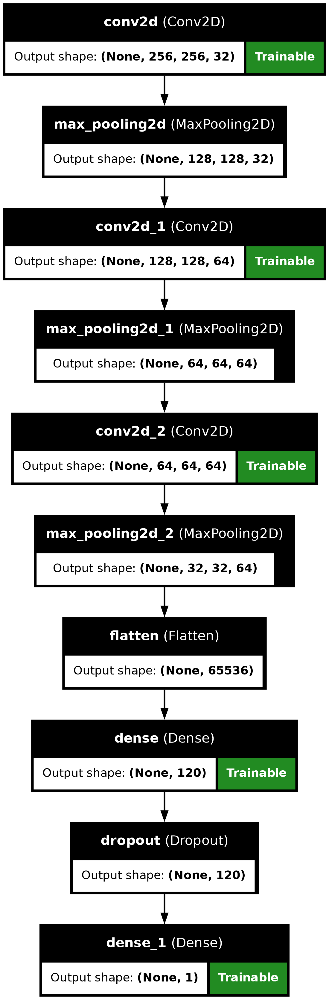

In [34]:
# plot the model

from keras.utils import plot_model

plot_model(model,show_shapes=True,show_trainable=True,show_layer_names=True)

In [35]:
# summary of the model

model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │     7,864,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 120)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           121 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,920,881 (30.22 MB)

 Trainable params: 7,920,881 (30.22 MB)

 Non-trainable params: 0 (0.00 B)

In [36]:
# compile the model

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy','recall'])

In [37]:
from keras.callbacks import EarlyStopping

In [38]:
early_stopping = EarlyStopping(min_delta=0.005, patience=5, verbose=1, restore_best_weights=True, start_from_epoch=30)

In [39]:
# fit the model on data for 50 epochs

history = model.fit(train_dataset, epochs=50, validation_data= val_dataset, callbacks=early_stopping)

Epoch 1/50
  2/782 ━━━━━━━━━━━━━━━━━━━━ 42s 55ms/step - accuracy: 0.5078 - loss: 122.7827 - recall: 0.6094 

I0000 00:00:1713156923.638056      94 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1713156923.657158      94 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


782/782 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step - accuracy: 0.5310 - loss: 5.5798 - recall: 0.5945

W0000 00:00:1713156968.154924      96 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


782/782 ━━━━━━━━━━━━━━━━━━━━ 75s 77ms/step - accuracy: 0.5311 - loss: 5.5745 - recall: 0.5944 - val_accuracy: 0.5328 - val_loss: 0.6838 - val_recall: 0.1340
Epoch 2/50
782/782 ━━━━━━━━━━━━━━━━━━━━ 45s 58ms/step - accuracy: 0.5678 - loss: 0.6719 - recall: 0.5468 - val_accuracy: 0.5889 - val_loss: 0.6569 - val_recall: 0.3137
Epoch 3/50
782/782 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - accuracy: 0.6138 - loss: 0.6479 - recall: 0.5518 - val_accuracy: 0.6705 - val_loss: 0.6069 - val_recall: 0.6020
Epoch 4/50
782/782 ━━━━━━━━━━━━━━━━━━━━ 46s 59ms/step - accuracy: 0.6453 - loss: 0.6121 - recall: 0.6192 - val_accuracy: 0.6830 - val_loss: 0.5850 - val_recall: 0.6143
Epoch 5/50
782/782 ━━━━━━━━━━━━━━━━━━━━ 47s 59ms/step - accuracy: 0.6932 - loss: 0.5667 - recall: 0.6630 - val_accuracy: 0.7185 - val_loss: 0.5432 - val_recall: 0.6018
Epoch 6/50
782/782 ━━━━━━━━━━━━━━━━━━━━ 46s 58ms/step - accuracy: 0.7356 - loss: 0.5076 - recall: 0.7112 - val_accuracy: 0.6845 - val_loss: 0.5878 - val_recall: 0.8767
Epo

In [55]:
# see the history in a df

history_df = pd.DataFrame(history.history)

history_df

,accuracy,loss,recall,val_accuracy,val_loss,val_recall
0,0.54248,1.495512,0.53072,0.532750,0.683795,0.13400
1,0.58364,0.665329,0.55768,0.588875,0.656925,0.31375
2,0.62204,0.640377,0.59368,0.670500,0.606949,0.60200
3,0.65652,0.602148,0.62992,0.683000,0.585014,0.61425
4,0.71068,0.541903,0.68528,0.718500,0.543170,0.60175
5,0.75544,0.482612,0.73464,0.684500,0.587835,0.87675
6,0.80128,0.410337,0.78344,0.734375,0.534217,0.61075
7,0.81592,0.394190,0.80136,0.775250,0.490575,0.79650
8,0.84820,0.339869,0.83520,0.752500,0.518394,0.89525
9,0.86724,0.302275,0.85568,0.786750,0.463261,0.68825


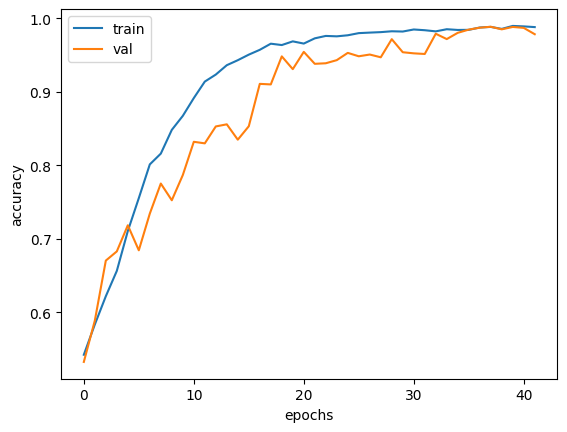

In [56]:
# plot the graphs for accuracy

plt.plot(history_df['accuracy'],label='train')
plt.plot(history_df['val_accuracy'],label='val')
plt.xlabel('epochs')
plt.ylabel('accuracy')
plt.legend()
plt.show()

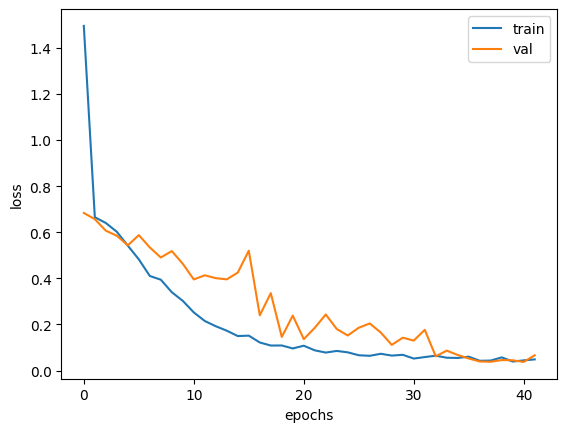

In [57]:
# plot the graphs for loss

plt.plot(history_df['loss'],label='train')
plt.plot(history_df['val_loss'],label='val')
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()
plt.show()

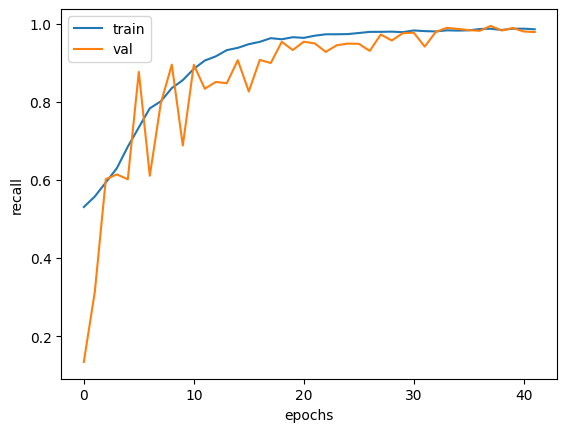

In [58]:
# plot the graphs for recall

plt.plot(history_df['recall'],label='train')
plt.plot(history_df['val_recall'],label='val')
plt.xlabel('epochs')
plt.ylabel('recall')
plt.legend()
plt.show()

In [59]:
# evaluate the model on validation data

model.evaluate(val_dataset)

250/250 ━━━━━━━━━━━━━━━━━━━━ 8s 30ms/step - accuracy: 0.9860 - loss: 0.0404 - recall: 0.9815


[0.039281848818063736, 0.9871249794960022, 0.9819999933242798]

In [65]:
# save the model

model_path = Path("/kaggle/working/model")

# make model directory
model_path.mkdir(exist_ok=True)

In [67]:
# save the model

model.save(model_path / 'model.keras')

In [68]:
from keras.saving import load_model

In [69]:
# load the model

loaded_model = load_model(model_path / 'model.keras')

In [70]:
# summary of the loaded model

loaded_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 256, 256, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 128, 128, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 128, 128, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 64, 64, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 64, 64, 64)     │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 65536)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 120)            │     7,864,440 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 120)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 1)              │           121 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,762,645 (90.65 MB)

 Trainable params: 7,920,881 (30.22 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 15,841,764 (60.43 MB)

In [85]:
# see the kenels of the first layer

layer_1_weights = model.layers[0].get_weights()[0]

layer_1_weights.shape

(3, 3, 3, 32)

In [106]:
import seaborn as sns

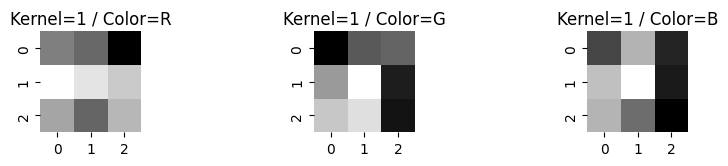

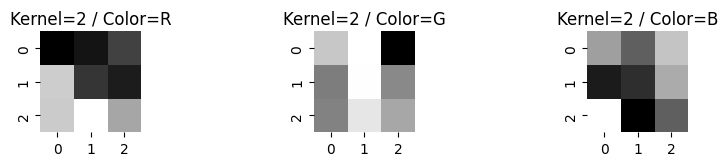

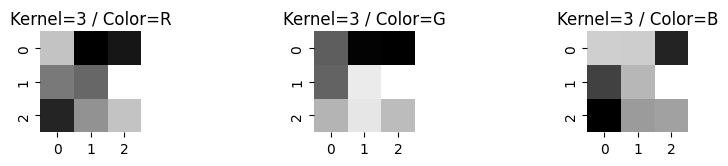

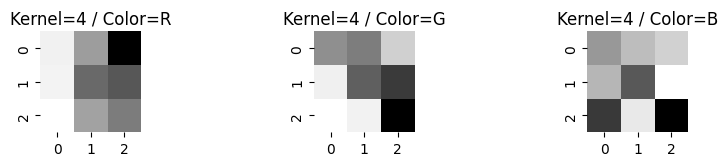

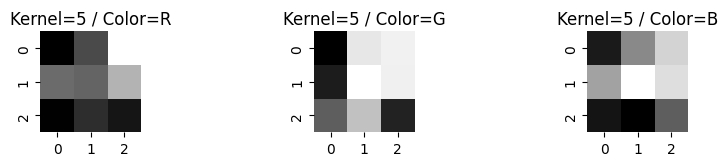

...

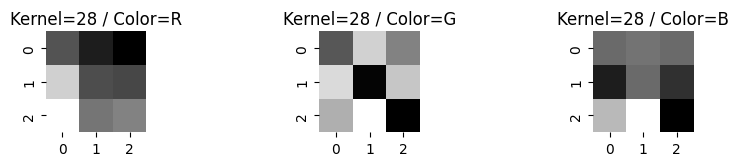

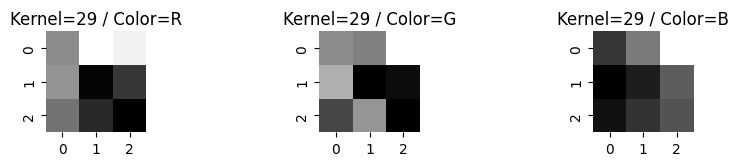

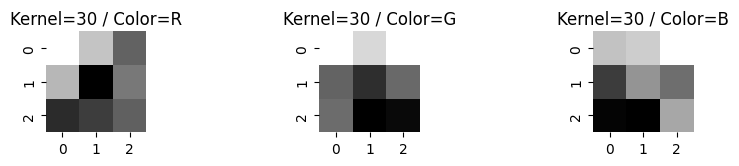

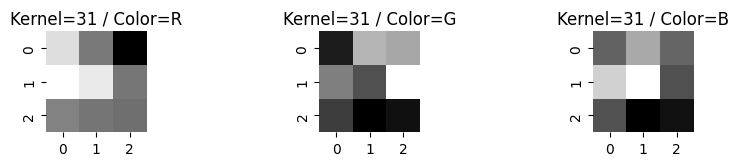

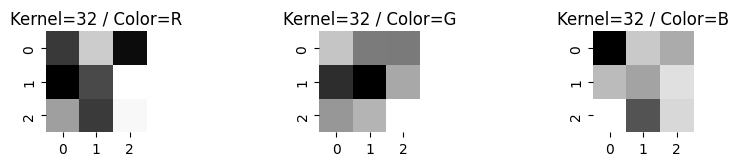

In [117]:
# print the kernels to visualize the them 

color_list = ['R','G','B']
for ind in range(32):
    kernel = layer_1_weights[:,:,:,ind].reshape(3,3,3)
    plt.figure(figsize=(10,50))
    for color in range(3):
        img = kernel[:,:,color].reshape(3,3)
        # plot the image of kernel
        plt.subplot(32,3,color+1)
        sns.heatmap(data=img, cmap='gray',square=True, cbar=None)
        plt.title(f'Kernel={ind+1} / Color={color_list[color]}')
        
        
    plt.show()

In [137]:
from keras.models import Model

In [138]:
from keras.utils import load_img, img_to_array

In [143]:
sample_img = load_img(path=dog_filenames[20],target_size=(256,256,3))
sample_img_arr = img_to_array(sample_img).reshape(1,256,256,3)

In [145]:
# see the output of an image from the first convolution layer

outputs = model.layers[0].output

# make a model for the outputs

image_model = Model(inputs=model.inputs ,outputs=outputs)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


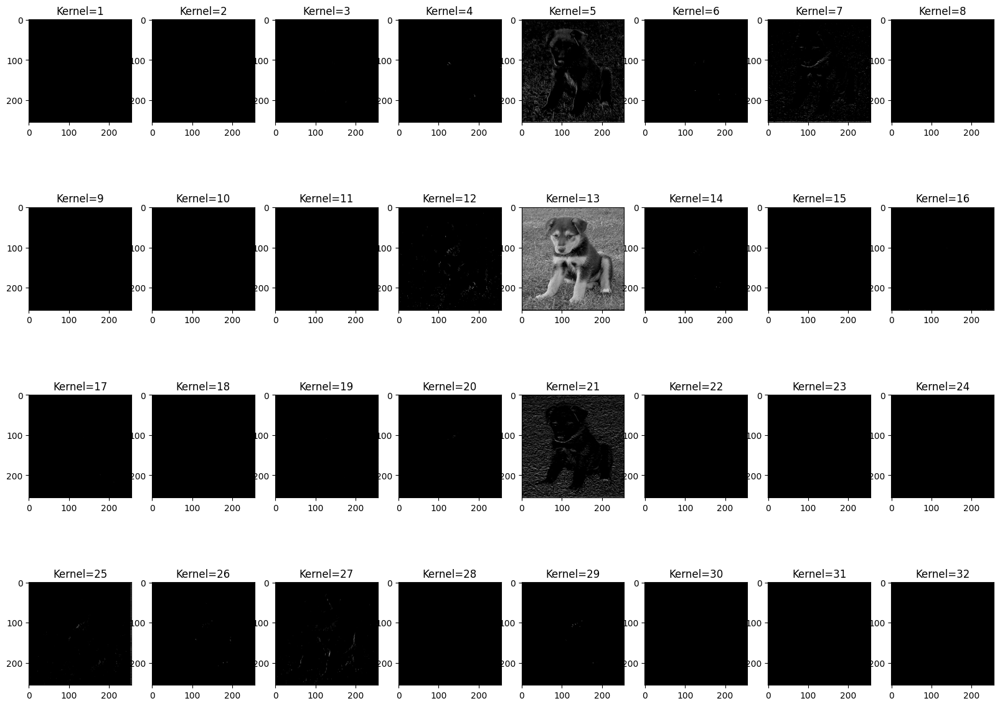

In [152]:
# do the predictions

image_model_pred = image_model.predict(sample_img_arr).reshape(256,256,32)

plt.figure(figsize=(20,15))
num_rows = 32 // 8
num_cols = 8
for i in range(32):
    plt.subplot(num_rows,num_cols,i+1)
    plt.imshow(image_model_pred[:,:,i], cmap='gray')
    plt.title(f'Kernel={i+1}')

In [153]:
# do predictions on test data

test_data_path = image_directory / 'test1' / 'test1'

In [154]:
test_data_filenames = list(test_data_path.iterdir())

In [155]:
test_data_filenames[0]

PosixPath('/kaggle/input/dog-vs-cat-images-data/dogcat/test1/test1/7981.jpg')

In [156]:
from keras.utils import load_img, img_to_array

In [157]:
def class_predictions(filename):
    img = load_img(path=filename,target_size=(256,256,3))
    img_arr = img_to_array(img).reshape(1,256,256,3)
    prediction = model.predict(img_arr)[0][0]
    print(prediction)
    if prediction >= 0.5:
        print('Dog')
    else:
        print('Cat')
    
    plt.imshow(img)
    plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.99999845
Dog


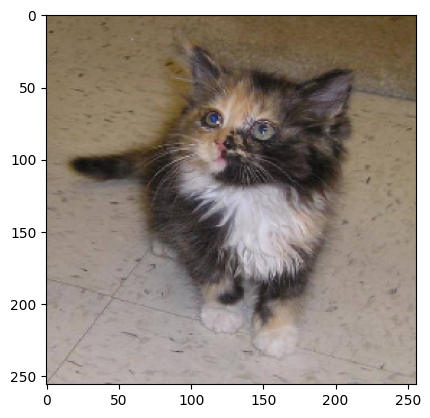

In [158]:
# randomly select a filename

from random import choice

random_img = choice(test_data_filenames)

class_predictions(random_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.6301207
Dog


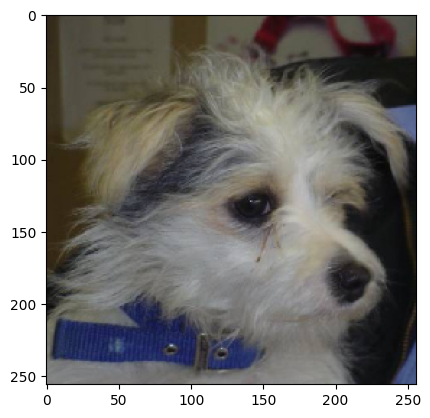

In [159]:
random_img = choice(test_data_filenames)

class_predictions(random_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.99985445
Dog


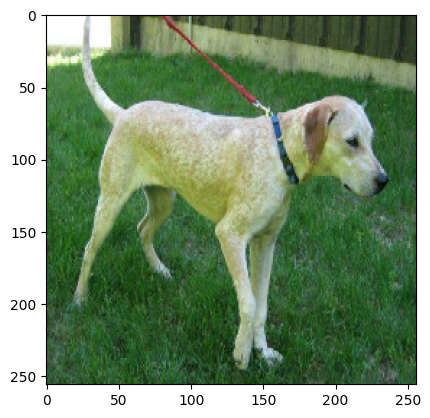

In [160]:
random_img = choice(test_data_filenames)

class_predictions(random_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.00895597
Cat


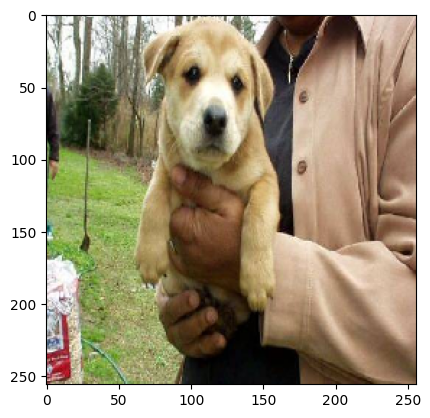

In [161]:
random_img = choice(test_data_filenames)

class_predictions(random_img)

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.96151966
Dog


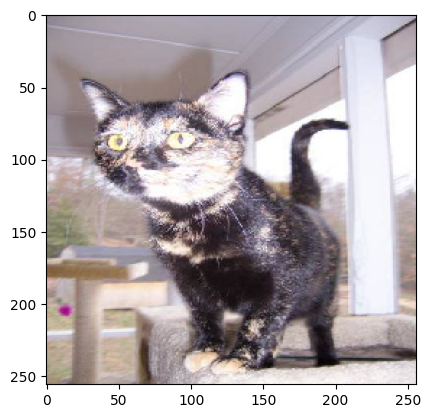

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
0.03755885
Cat


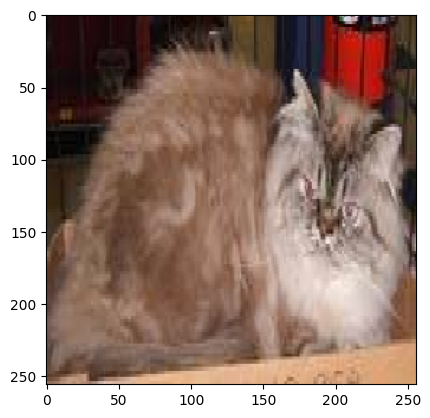

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.0017878236
Cat


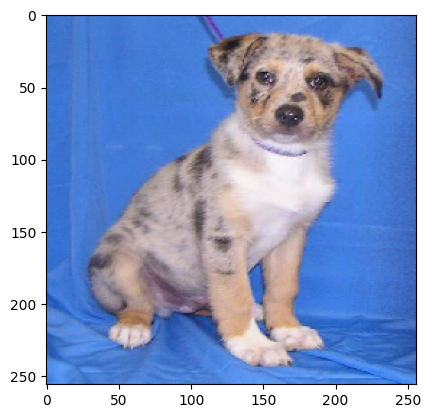

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1.8819645e-05
Cat


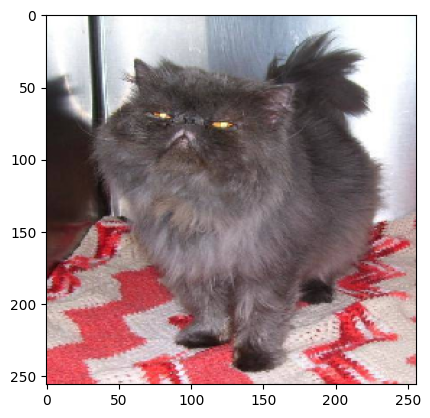

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.6253419
Dog


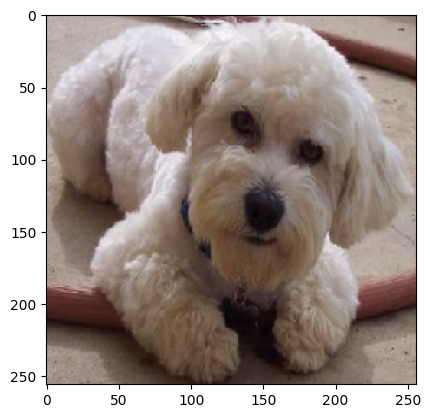

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.8469035
Dog


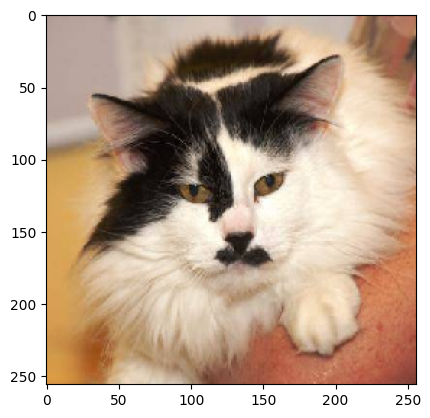

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.7157433
Dog


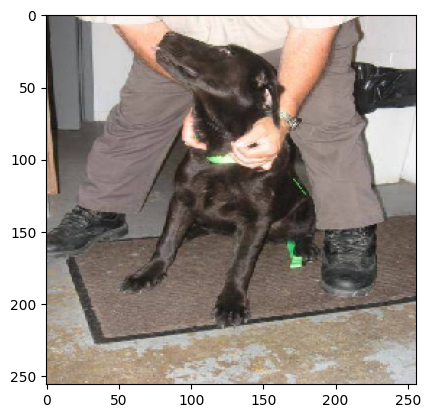

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.10821154
Cat


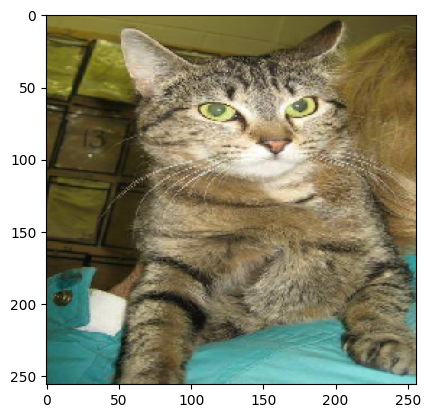

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.0009681783
Cat


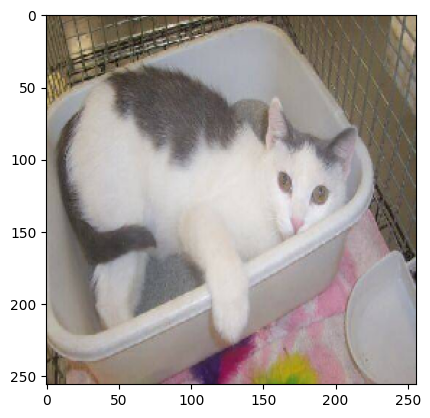

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.9670168
Dog


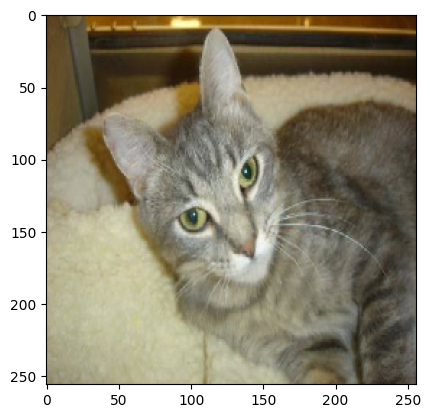

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.68766207
Dog


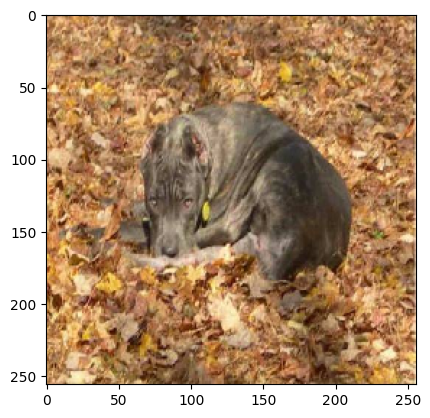

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.9935364
Dog


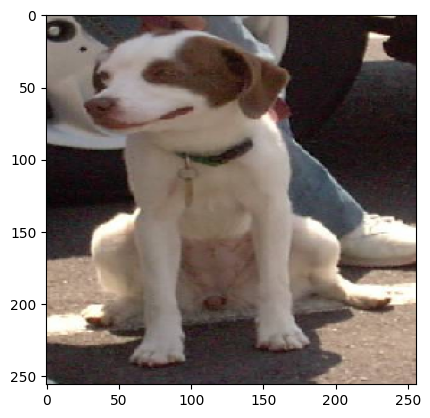

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.380805
Cat


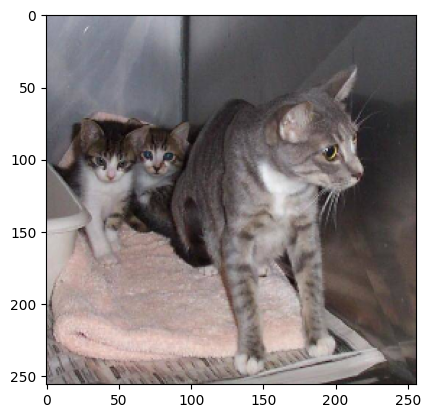

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.11981401
Cat


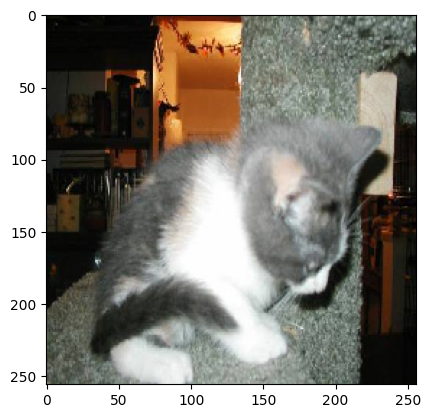

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
0.9999999
Dog


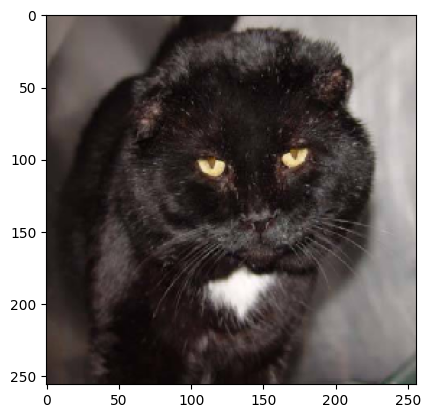

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.5869143
Dog


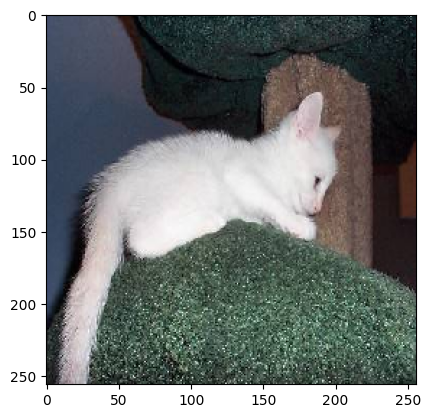

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.98789024
Dog


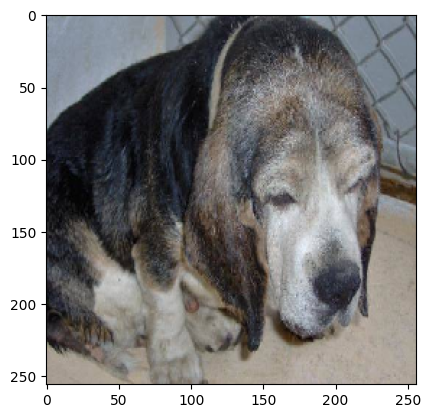

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
0.9987312
Dog


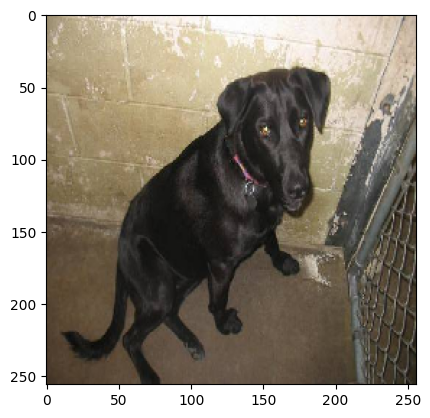

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
1.3839542e-09
Cat


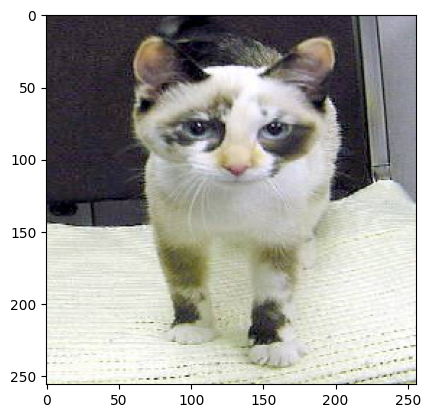

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step
0.99980515
Dog


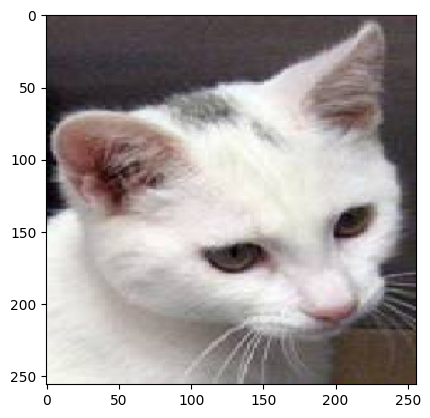

In [162]:
for i in range(20):
    random_img = choice(test_data_filenames)

    class_predictions(random_img)